In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input
import matplotlib.pyplot as plt
from tqdm import tqdm
import os
import cv2
import numpy as np
import time
import random

In [2]:
def sinusoidal_embedding(timesteps, embedding_dim=128):
    half_dim = embedding_dim // 2
    exponent = -tf.math.log(10000.0) / (half_dim - 1)
    embedding_basis = tf.exp(tf.range(half_dim, dtype=tf.float32) * exponent)
    timesteps_float = tf.cast(timesteps, dtype=tf.float32)
    embeddings = tf.concat([tf.sin(timesteps_float[:, None] * embedding_basis[None, :]),
                            tf.cos(timesteps_float[:, None] * embedding_basis[None, :])], axis=-1)
    return embeddings

def unet_block(input_tensor, num_filters):
    x = layers.Conv2D(num_filters, kernel_size=3, padding="same", activation="relu")(input_tensor)
    x = layers.Conv2D(num_filters, kernel_size=3, padding="same", activation="relu")(x)
    return x

#FiLM (Feature-wise Linear Modulation) jedna od mogućih metoda za dodavanje vremenskih oznaka modelu
# proširenje osnovne metode na načine da se prijašnji izlazi koriste za oznake (sampling), doprinosi stabilnosti DDPM-ova

def apply_film(x, t, channels):
    gamma = layers.Dense(channels)(t)
    beta = layers.Dense(channels)(t)
    gamma = layers.Reshape((1, 1, channels))(gamma)
    beta = layers.Reshape((1, 1, channels))(beta)
    return layers.Multiply()([x, gamma]) + beta

def unet_model(input_shape, time_embedding_dim=128):
    inputs = keras.Input(shape=input_shape)
    time_input = keras.Input(shape=(time_embedding_dim,))

    # Encoder
    skip1 = unet_block(inputs, 64)
    conv1_with_time = apply_film(skip1, time_input, 64)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1_with_time)

    skip2 = unet_block(pool1, 128)
    conv2_with_time = apply_film(skip2, time_input, 128)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2_with_time)

    skip3 = unet_block(pool2, 256)
    conv3_with_time = apply_film(skip3, time_input, 256)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3_with_time)

    skip4 = unet_block(pool3, 512)
    conv4_with_time = apply_film(skip4, time_input, 512)
    pool4 = layers.MaxPooling2D(pool_size=(2, 2))(conv4_with_time)

    conv5 = unet_block(pool4, 1024)

    up6 = layers.concatenate([layers.Conv2DTranspose(512, kernel_size=2, strides=(2, 2), padding="same")(conv5), skip4], axis=-1)
    conv6 = unet_block(up6, 512)

    up7 = layers.concatenate([layers.Conv2DTranspose(256, kernel_size=2, strides=(2, 2), padding="same")(conv6), skip3], axis=-1)
    conv7 = unet_block(up7, 256)

    up8 = layers.concatenate([layers.Conv2DTranspose(128, kernel_size=2, strides=(2, 2), padding="same")(conv7), skip2], axis=-1)
    conv8 = unet_block(up8, 128)

    up9 = layers.concatenate([layers.Conv2DTranspose(64, kernel_size=2, strides=(2, 2), padding="same")(conv8), skip1], axis=-1)
    conv9 = unet_block(up9, 64)

    outputs = layers.Conv2D(3, kernel_size=1, activation="sigmoid")(conv9) # Assuming output is an image

    model = keras.Model(inputs=[inputs, time_input], outputs=outputs)

    return model

In [3]:
def cosine_beta_schedule(timesteps, s=0.008):
    steps = timesteps + 1
    x = tf.linspace(0.0, timesteps, steps)
    alphas_cumprod = tf.cos(((x / timesteps) + s) / (1 + s) * tf.constant(np.pi) * 0.5)**2
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
    return tf.clip_by_value(betas, 0.0001, 0.9999)

def add_noise(image, timestep, sqrt_alphas_cumprod, sqrt_one_minus_alpha_cumprod):
    sqrt_alphas_cumprod_t = tf.gather(sqrt_alphas_cumprod, timestep)
    sqrt_alphas_cumprod_t = tf.reshape(sqrt_alphas_cumprod_t, [-1, 1, 1, 1])

    sqrt_one_minus_alphas_cumprod_t = tf.gather(sqrt_one_minus_alphas_cumprod, timestep)
    sqrt_one_minus_alphas_cumprod_t = tf.reshape(sqrt_one_minus_alphas_cumprod_t, [-1, 1, 1, 1])

    noise = tf.random.normal(shape=tf.shape(image))
    noisy_image = sqrt_alphas_cumprod_t * image + sqrt_one_minus_alphas_cumprod_t * noise
    return noisy_image, noise

In [4]:
def compress_and_save_images(hr_dir, output_base_dir, quality_levels, scale_factor=4):
    if not os.path.exists(output_base_dir):
        os.makedirs(output_base_dir)
        print(f"Created output directory: {output_base_dir}")

    hr_image_paths = sorted([
        os.path.join(hr_dir, f) for f in os.listdir(hr_dir)
        if f.lower().endswith('.png')
    ])

    if not hr_image_paths:
        print(f"No PNG images found in {hr_dir}. Please check the directory and file extensions.")
        return

    print(f"Found {len(hr_image_paths)} HR images.")

    for hr_path in hr_image_paths:
        filename = os.path.basename(hr_path)
        name, _ = os.path.splitext(filename)

        hr_img = cv2.imread(hr_path, cv2.IMREAD_COLOR)

        if hr_img is None:
            print(f"Warning: Could not read image {hr_path}. Skipping.")
            continue

        new_w = hr_img.shape[1] // scale_factor
        new_h = hr_img.shape[0] // scale_factor

        lr_img = cv2.resize(hr_img, (new_w, new_h), interpolation=cv2.INTER_CUBIC)

        for quality in quality_levels:
            quality_output_dir = os.path.join(output_base_dir, str(quality))
            if not os.path.exists(quality_output_dir):
                os.makedirs(quality_output_dir)

            output_filename = f"{name}_q{quality}.jpg"
            output_path = os.path.join(quality_output_dir, output_filename)

            success = cv2.imwrite(output_path, lr_img, [int(cv2.IMWRITE_JPEG_QUALITY), quality])

            if success:
                print(f"Compressed {filename} at quality {quality} and saved to {output_path}")
            else:
                print(f"Error compressing {filename} at quality {quality}.")

    print("Compression process finished.")

In [ ]:
#rm -r /content/compressed_div2k_val brisanje direktorija i njegovih sadržaja ako dođe do greške u
# idućem bloku komandi

In [5]:
hr_image_train_dir = '/content/drive/MyDrive/Datasets/Dataset/DIV2K_train_HR'
hr_image_val_dir = '/content/drive/MyDrive/Datasets/Dataset/DIV2K_valid_HR'
hr_image_test_dir = '/content/drive/MyDrive/Datasets/Dataset/DIV2K_test_HR'
compressed_output_train_dir = '/content/compressed_div2k_train'
compressed_output_val_dir = '/content/compressed_div2k_val'
compressed_output_test_dir = '/content/compressed_div2k_test'
compression_quality_levels = [50, 60, 70]

compress_and_save_images(hr_image_train_dir, compressed_output_train_dir, compression_quality_levels)
compress_and_save_images(hr_image_val_dir, compressed_output_val_dir, compression_quality_levels)
compress_and_save_images(hr_image_test_dir, compressed_output_test_dir, compression_quality_levels)

Created output directory: /content/compressed_div2k_train
Found 700 HR images.
Compressed 0001.png at quality 50 and saved to /content/compressed_div2k_train/50/0001_q50.jpg
Compressed 0001.png at quality 60 and saved to /content/compressed_div2k_train/60/0001_q60.jpg
Compressed 0001.png at quality 70 and saved to /content/compressed_div2k_train/70/0001_q70.jpg
Compressed 0002.png at quality 50 and saved to /content/compressed_div2k_train/50/0002_q50.jpg
Compressed 0002.png at quality 60 and saved to /content/compressed_div2k_train/60/0002_q60.jpg
Compressed 0002.png at quality 70 and saved to /content/compressed_div2k_train/70/0002_q70.jpg
Compressed 0003.png at quality 50 and saved to /content/compressed_div2k_train/50/0003_q50.jpg
Compressed 0003.png at quality 60 and saved to /content/compressed_div2k_train/60/0003_q60.jpg
Compressed 0003.png at quality 70 and saved to /content/compressed_div2k_train/70/0003_q70.jpg
Compressed 0004.png at quality 50 and saved to /content/compressed

In [6]:
def concatenate_lr_noisy_hr(lr_images, noisy_hr_images):
    return tf.concat([
        tf.image.resize(lr_images, tf.shape(noisy_hr_images)[1:3]),
        noisy_hr_images
    ], axis=-1)

In [7]:
def create_dataset(hr_dir, lr_dir, quality_levels, hr_patch_size=256, scale_factor=4, batch_size=16):
    hr_image_paths = sorted([os.path.join(hr_dir, f) for f in os.listdir(hr_dir)])

    dataset_pairs = []
    for hr_path in hr_image_paths:
        filename = os.path.basename(hr_path)
        name, _ = os.path.splitext(filename)
        # Odabirem samo jednu razinu kompresije nasumično za skupa podataka
        quality = random.choice(quality_levels)
        lr_filename = f"{name}_q{quality}.jpg"
        lr_path = os.path.join(lr_dir, str(quality), lr_filename)
        if os.path.exists(lr_path):
            dataset_pairs.append((hr_path, lr_path))

    if not dataset_pairs:
      raise ValueError("No valid hr-lr image pairs found.")

    hr_paths, lr_paths = zip(*dataset_pairs)
    path_dataset = tf.data.Dataset.from_tensor_slices((list(hr_paths), list(lr_paths)))

    def process_path(hr_path, lr_path):
        hr_img = tf.io.read_file(hr_path)
        hr_img = tf.image.decode_png(hr_img, channels=3)
        hr_img = tf.image.convert_image_dtype(hr_img, tf.float32)

        lr_img = tf.io.read_file(lr_path)
        lr_img = tf.image.decode_jpeg(lr_img, channels=3)
        lr_img = tf.image.convert_image_dtype(lr_img, tf.float32)

        hr_crop_size = hr_patch_size
        lr_crop_size = hr_crop_size // scale_factor

        hr_shape = tf.shape(hr_img)[:2]
        lr_shape = tf.shape(lr_img)[:2]

        lr_max_x = lr_shape[1] - lr_crop_size
        lr_max_y = lr_shape[0] - lr_crop_size
        lr_x = tf.random.uniform([], 0, lr_max_x + 1, dtype=tf.int32)
        lr_y = tf.random.uniform([], 0, lr_max_y + 1, dtype=tf.int32)

        lr_patch = tf.image.crop_to_bounding_box(lr_img, lr_y, lr_x, lr_crop_size, lr_crop_size)

        hr_x = lr_x * scale_factor
        hr_y = lr_y * scale_factor

        hr_patch = tf.image.crop_to_bounding_box(hr_img, hr_y, hr_x, hr_crop_size, hr_crop_size)

        lr_patch_up = tf.image.resize(lr_patch, [hr_crop_size, hr_crop_size], method='bicubic')

        return lr_patch_up, hr_patch

    dataset = path_dataset.shuffle(buffer_size=len(dataset_pairs)).map(process_path, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(batch_size).prefetch(buffer_size=tf.data.AUTOTUNE)

    return dataset

In [8]:
def build_perceptual_model():
    vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
    selected_layers = ['block1_conv2', 'block2_conv2', 'block3_conv3']
    outputs = [vgg.get_layer(name).output for name in selected_layers]
    return tf.keras.Model(inputs=vgg.input, outputs=outputs)

# Global VGG feature extractor
perceptual_model = build_perceptual_model()

def perceptual_loss(y_true, y_pred, vgg_model):
    y_true = tf.keras.applications.vgg19.preprocess_input(y_true * 255.0)
    y_pred = tf.keras.applications.vgg19.preprocess_input(y_pred * 255.0)

    true_features = vgg_model(y_true)
    pred_features = vgg_model(y_pred)

    loss = 0.0
    for true_f, pred_f in zip(true_features, pred_features):
        norm = tf.reduce_mean(tf.abs(true_f)) + 1e-6  # Optional normalization
        loss += tf.reduce_mean(tf.abs(true_f - pred_f)) / norm  # Relative difference
    return loss

def combined_loss(y_true, y_pred, vgg_model):
    mae = tf.reduce_mean(tf.abs(y_true - y_pred))
    perceptual = perceptual_loss(y_true, y_pred, vgg_model)
    return mae + 0.01 * perceptual  # Adjust weight as needed

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [9]:
def ramp_weight(epoch, ramp_length=10, max_weight=0.01):
    epoch = tf.cast(epoch, tf.float32)
    if epoch < ramp_length:
        return max_weight * 0.5 * (1 - tf.cos(np.pi * epoch / ramp_length))
    return tf.constant(max_weight, dtype=tf.float32)

In [10]:
@tf.function
def train_step(hr_batch, lr_batch, model, timesteps, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod, current_epoch, vgg_model):
    batch_size = tf.shape(hr_batch)[0]
    t = tf.random.uniform(shape=[batch_size], minval=0, maxval=timesteps, dtype=tf.int32)

    # Add noise
    noisy_hr_batch, noise = add_noise(hr_batch, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod)
    lr_up = tf.image.resize(lr_batch, tf.shape(hr_batch)[1:3], method="bicubic")
    model_input = concatenate_lr_noisy_hr(lr_up, noisy_hr_batch)
    time_embeddings = sinusoidal_embedding(t)

    with tf.GradientTape() as tape:
        predicted_noise = model([model_input, time_embeddings], training=True)

        # Predict clean image from noise
        sqrt_alpha = tf.reshape(tf.gather(sqrt_alphas_cumprod, t), [-1, 1, 1, 1])
        sqrt_one_minus_alpha = tf.reshape(tf.gather(sqrt_one_minus_alphas_cumprod, t), [-1, 1, 1, 1])
        predicted_clean = (noisy_hr_batch - sqrt_one_minus_alpha * predicted_noise) / sqrt_alpha
        predicted_clean = tf.clip_by_value(predicted_clean, 0.0, 1.0)

        # MAE loss with timestep-based weighting
        base_mae = tf.reduce_mean(tf.abs(hr_batch - predicted_clean), axis=[1,2,3])
        timestep_weight = 1.0 + tf.cast(t, tf.float32) / tf.cast(timesteps, tf.float32)
        weighted_mae = tf.reduce_mean(base_mae * timestep_weight)

        # Perceptual loss with epoch ramping
        perc_weight = ramp_weight(current_epoch)
        perc = perceptual_loss(hr_batch, predicted_clean, vgg_model)

        loss = weighted_mae + perc_weight * perc

    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))

    return loss, weighted_mae, perc

In [11]:
@tf.function
def validation_step(hr_batch, lr_batch, model, timesteps,
                    sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod,
                    current_epoch, vgg_model):
    batch_size = tf.shape(hr_batch)[0]
    t = tf.random.uniform(shape=[batch_size], minval=0, maxval=timesteps, dtype=tf.int32)

    noisy_hr_batch, noise = add_noise(hr_batch, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod)
    lr_up = tf.image.resize(lr_batch, tf.shape(hr_batch)[1:3], method="bicubic")
    model_input = concatenate_lr_noisy_hr(lr_up, noisy_hr_batch)
    time_embeddings = sinusoidal_embedding(t)

    predicted_noise = model([model_input, time_embeddings], training=False)

    sqrt_alpha = tf.reshape(tf.gather(sqrt_alphas_cumprod, t), [-1, 1, 1, 1])
    sqrt_one_minus_alpha = tf.reshape(tf.gather(sqrt_one_minus_alphas_cumprod, t), [-1, 1, 1, 1])
    predicted_clean = (noisy_hr_batch - sqrt_one_minus_alpha * predicted_noise) / sqrt_alpha
    predicted_clean = tf.clip_by_value(predicted_clean, 0.0, 1.0)

    # Linearno povećavanje perceptualnog gubitka
    # perc_weight = tf.minimum(0.01 * (tf.cast(current_epoch, tf.float32) / 10.0), 0.01)
    perc_weight = ramp_weight(current_epoch)
    mae = tf.reduce_mean(tf.abs(hr_batch - predicted_clean))
    perc = perceptual_loss(hr_batch, predicted_clean, vgg_model)
    val_loss = mae + perc_weight * perc

    return val_loss, mae, perc

In [12]:
#@tf.function
def init_optimizer(model, optimizer, vgg_model):
    dummy_hr = tf.zeros((1, hr_patch_size, hr_patch_size, 3))
    dummy_lr = tf.zeros((1, hr_patch_size // scale_factor, hr_patch_size // scale_factor, 3))
    t = tf.constant([0])

    noisy_hr, noise = add_noise(dummy_hr, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod)
    lr_up = tf.image.resize(dummy_lr, (hr_patch_size, hr_patch_size), method="bicubic")
    model_input = concatenate_lr_noisy_hr(lr_up, noisy_hr)
    time_emb = sinusoidal_embedding(t)

    with tf.GradientTape() as tape:
        predicted_noise = model([model_input, time_emb], training=True)

        # Reconstruct the image from noise prediction
        alpha = tf.gather(sqrt_alphas_cumprod, t)
        alpha = tf.reshape(alpha, [-1, 1, 1, 1])
        pred_clean = (noisy_hr - predicted_noise * tf.sqrt(1.0 - alpha)) / alpha

        # Use the same combined loss as in training
        loss = combined_loss(dummy_hr, pred_clean, vgg_model)

    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))

In [13]:
def sample(lr_image, model, timesteps=2000, sampling_steps=None):
    if len(tf.shape(lr_image)) == 3:
        lr_image = tf.expand_dims(lr_image, axis=0)

    batch_size = tf.shape(lr_image)[0]
    height, width, channels = tf.shape(lr_image)[1], tf.shape(lr_image)[2], tf.shape(lr_image)[3]

    x_t = tf.random.normal(shape=(batch_size, height, width, channels))

    if sampling_steps is None:
        sampling_steps = timesteps
    sample_timesteps = np.linspace(timesteps - 1, 0, sampling_steps, dtype=np.int32)

    betas = cosine_beta_schedule(timesteps)
    alphas = 1.0 - betas
    alphas_cumprod = tf.math.cumprod(alphas, axis=0)
    alphas_cumprod_prev = tf.concat([tf.constant([1.0], dtype=tf.float32), alphas_cumprod[:-1]], axis=0)

    for i, t in enumerate(sample_timesteps):
        t_batch = tf.fill([batch_size], t)

        model_image_input = concatenate_lr_noisy_hr(lr_image, x_t)
        time_embeddings = sinusoidal_embedding(t_batch)

        predicted_noise = model([model_image_input, time_embeddings], training=False)

        alpha_t = tf.reshape(alphas[t], [-1, 1, 1, 1])
        alpha_cumprod_t = tf.reshape(alphas_cumprod[t], [-1, 1, 1, 1])
        alpha_cumprod_prev_t = tf.reshape(alphas_cumprod_prev[t], [-1, 1, 1, 1])
        beta_t = tf.reshape(betas[t], [-1, 1, 1, 1])

        mean = (x_t - beta_t * predicted_noise / tf.math.sqrt(1.0 - alpha_cumprod_t)) / tf.math.sqrt(alpha_t)

        if t > 0:
            variance = (1.0 - alpha_cumprod_prev_t) / (1.0 - alpha_cumprod_t) * beta_t
            log_variance = tf.math.log(variance) if i == 0 else tf.math.log(beta_t)

            noise = tf.random.normal(shape=tf.shape(x_t))
            x_t = mean + tf.math.exp(0.5 * log_variance) * noise
        else:
            x_t = mean

        x_t = tf.clip_by_value(x_t, 0.0, 1.0)

    return x_t

In [14]:
def visualize_sample(model, dataset, timesteps, epoch=None, save_dir=None, num_samples=3):
    all_psnr, all_ssim = [], []

    for lr_batch, hr_batch in dataset.take(1):
        for i in range(min(num_samples, lr_batch.shape[0])):
            lr_img = lr_batch[i:i+1]
            hr_img = hr_batch[i:i+1]
            sample_output = sample(lr_img, model, timesteps)

            lr_img_np = tf.squeeze(lr_img).numpy()
            sr_img_np = tf.squeeze(sample_output).numpy()
            hr_img_np = tf.squeeze(hr_img).numpy()

            psnr_val = tf.image.psnr(sr_img_np, hr_img_np, max_val=1.0)
            ssim_val = tf.image.ssim(sr_img_np, hr_img_np, max_val=1.0)
            all_psnr.append(psnr_val.numpy())
            all_ssim.append(ssim_val.numpy())

            #Plotting
            plt.figure(figsize=(12, 4))
            titles = ['LR Input', 'SR Output', 'HR Ground Truth']
            images = [lr_img_np, sr_img_np, hr_img_np]
            for j in range(3):
                plt.subplot(1, 3, j + 1)
                plt.imshow(np.clip(images[j], 0, 1))
                plt.title(titles[j])
                plt.axis('off')
            plt.tight_layout()

            if save_dir and epoch is not None:
                os.makedirs(save_dir, exist_ok=True)
                image_path = os.path.join(save_dir, f"epoch_{epoch+1}_sample_{i+1}.png")
                plt.savefig(image_path)
                print(f"Saved visualization: {image_path}")

            plt.show()

    mean_psrn = np.mean(all_psnr)
    mean_ssim = np.mean(all_ssim)
    print(f"Metrics for epoch: {epoch + 1} Mean PSNR: {mean_psrn}, Mean SSIM: {mean_ssim}")

In [15]:
# --- Main Training Loop Setup ---
train_hr_dir = '/content/drive/MyDrive/Datasets/Dataset/DIV2K_train_HR'
compressed_train_dir = '/content/compressed_div2k_train'
valid_hr_dir = '/content/drive/MyDrive/Datasets/Dataset/DIV2K_valid_HR'
compressed_valid_dir = '/content/compressed_div2k_val'
test_hr_dir = '/content/drive/MyDrive/Datasets/Dataset/DIV2K_test_HR'
compressed_test_dir = '/content/compressed_div2k_test'

quality_levels = [50, 60, 70]
hr_patch_size = 128
scale_factor = 4
batch_size = 32
timesteps = 2000
epochs = 30
steps_per_epoch = 1000 # Since the dataset repeats, define a fixed number of steps

betas = cosine_beta_schedule(timesteps)
alphas = 1.0 - betas
alphas_cumprod = tf.math.cumprod(alphas, axis=0)
sqrt_alphas_cumprod = tf.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = tf.sqrt(1.0 - alphas_cumprod)

train_dataset = create_dataset(train_hr_dir, compressed_train_dir, quality_levels, hr_patch_size, scale_factor, batch_size)
valid_dataset = create_dataset(valid_hr_dir, compressed_valid_dir, quality_levels, hr_patch_size, scale_factor, batch_size)
test_dataset = create_dataset(test_hr_dir, compressed_test_dir, quality_levels, hr_patch_size, scale_factor, batch_size)

input_channels = 3 + 3
model = unet_model(input_shape=(hr_patch_size, hr_patch_size, input_channels))

dummy_input = tf.zeros((1, hr_patch_size, hr_patch_size, input_channels))
dummy_t = tf.constant([0])
dummy_time_embedding = sinusoidal_embedding(dummy_t)
_ = model([dummy_input, dummy_time_embedding])

optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)

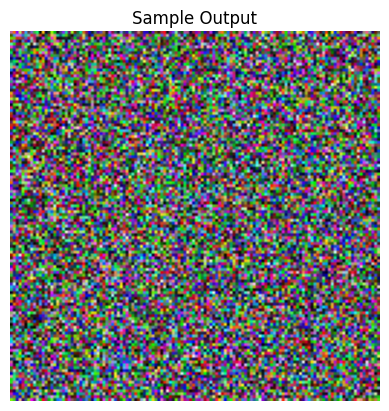

In [16]:
# Testiranje sample funkcije kako ne bi morao trenirati nekoliko epoha svaki put prije errora

for lr, hr in train_dataset.take(1):
    test_lr_image = lr[0:1]

test_sample = sample(test_lr_image, model, timesteps=1000, sampling_steps=50)

plt.imshow(tf.squeeze(test_sample).numpy())
plt.title("Sample Output")
plt.axis("off")
plt.show()

In [17]:
# Zbog @tf.function nije moguće runat dva puta po runtime-u zato je u zasebnom bloku
init_optimizer(model, optimizer, perceptual_model)

Starting training...


Epoch 1/30 | Train Loss: 0.0115 | MAE: 0.0115 | Perc: 0.1308 || Val Loss: 0.0137 | MAE: 0.0137 | Perc: 0.2573 || PSNR: 8.14 | SSIM: 0.0096


Epoch 2/30 | Train Loss: 0.0110 | MAE: 0.0109 | Perc: 0.1292 || Val Loss: 0.0124 | MAE: 0.0123 | Perc: 0.2432 || PSNR: 8.44 | SSIM: 0.0132


Validation:   3%|▎         | 3/100 [00:13<07:03,  4.37s/it, val_loss=0.287]WARNING:tensorflow:6 out of the last 12 calls to <function validation_step at 0x7effa3f32200> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.


Epoch 3/30 | Train Loss: 0.0100 | MAE: 0.0099 | Perc: 0.1242 || Val Loss: 0.0109 | MAE: 0.0107 | Perc: 0.2302 || PSNR: 8.82 | SSIM: 0.0156


Epoch 4/30 | Train Loss: 0.0103 | MAE: 0.0101 | Perc: 0.1248 || Val Loss: 0.0110 | MAE: 0.0106 | Perc: 0.2031 || PSNR: 8.87 | SSIM: 0.0188


Epoch 5/30 | Train Loss: 0.0102 | MAE: 0.0098 | Perc: 0.1186 || Val Loss: 0.0109 | MAE: 0.0102 | Perc: 0.2211 || PSNR: 9.00 | SSIM: 0.0172


Epoch 6/30 | Train Loss: 0.0098 | MAE: 0.0092 | Perc: 0.1201 || Val Loss: 0.0120 | MAE: 0.0109 | Perc: 0.2172 || PSNR: 9.00 | SSIM: 0.0185


Epoch 7/30 | Train Loss: 0.0112 | MAE: 0.0103 | Perc: 0.1283 || Val Loss: 0.0127 | MAE: 0.0111 | Perc: 0.2405 || PSNR: 9.01 | SSIM: 0.0181


Epoch 8/30 | Train Loss: 0.0107 | MAE: 0.0098 | Perc: 0.1212 || Val Loss: 0.0115 | MAE: 0.0099 | Perc: 0.2040 || PSNR: 9.37 | SSIM: 0.0199


Epoch 9/30 | Train Loss: 0.0110 | MAE: 0.0099 | Perc: 0.1228 || Val Loss: 0.0127 | MAE: 0.0106 | Perc: 0.2263 || PSNR: 9.14 | SSIM: 0.0195


Epoch 10/30 | Train Loss: 0.0112 | MAE: 0.0100 | Perc: 0.1219 || Val Loss: 0.0143 | MAE: 0.0120 | Perc: 0.2356 || PSNR: 8.99 | SSIM: 0.0184
Saved visualization: /content/drive/MyDrive/Rezultati/epoch_10_sample_1.png


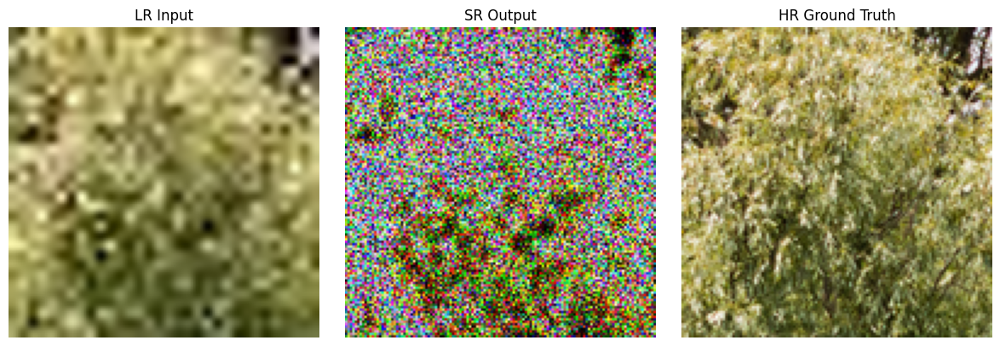

Saved visualization: /content/drive/MyDrive/Rezultati/epoch_10_sample_2.png


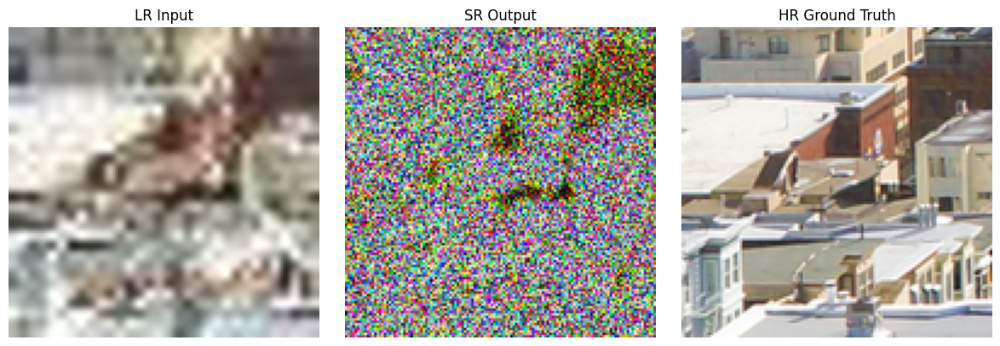

Saved visualization: /content/drive/MyDrive/Rezultati/epoch_10_sample_3.png


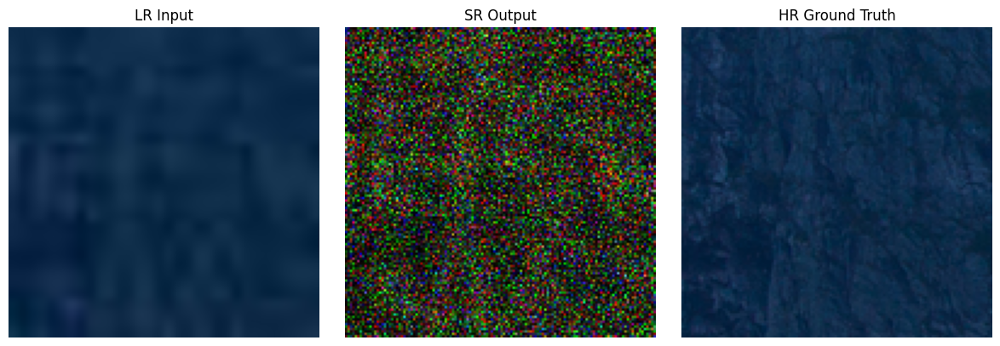

Metrics for epoch: 10 Mean PSNR: 10.427512168884277, Mean SSIM: 0.03073158860206604
Saved model weights at epoch 10


Epoch 11/30 | Train Loss: 0.0111 | MAE: 0.0099 | Perc: 0.1227 || Val Loss: 0.0127 | MAE: 0.0105 | Perc: 0.2209 || PSNR: 9.22 | SSIM: 0.0185


Epoch 12/30 | Train Loss: 0.0112 | MAE: 0.0100 | Perc: 0.1231 || Val Loss: 0.0130 | MAE: 0.0107 | Perc: 0.2309 || PSNR: 9.27 | SSIM: 0.0211


Epoch 13/30 | Train Loss: 0.0112 | MAE: 0.0099 | Perc: 0.1256 || Val Loss: 0.0126 | MAE: 0.0103 | Perc: 0.2278 || PSNR: 9.23 | SSIM: 0.0190


Epoch 14/30 | Train Loss: 0.0109 | MAE: 0.0096 | Perc: 0.1233 || Val Loss: 0.0147 | MAE: 0.0122 | Perc: 0.2519 || PSNR: 9.23 | SSIM: 0.0202


Epoch 15/30 | Train Loss: 0.0108 | MAE: 0.0096 | Perc: 0.1200 || Val Loss: 0.0137 | MAE: 0.0114 | Perc: 0.2279 || PSNR: 9.34 | SSIM: 0.0209


Epoch 16/30 | Train Loss: 0.0109 | MAE: 0.0097 | Perc: 0.1231 || Val Loss: 0.0134 | MAE: 0.0111 | Perc: 0.2353 || PSNR: 9.33 | SSIM: 0.0212


Epoch 17/30 | Train Loss: 0.0106 | MAE: 0.0094 | Perc: 0.1211 || Val Loss: 0.0139 | MAE: 0.0115 | Perc: 0.2384 || PSNR: 9.28 | SSIM: 0.0206


Epoch 18/30 | Train Loss: 0.0111 | MAE: 0.0099 | Perc: 0.1227 || Val Loss: 0.0116 | MAE: 0.0095 | Perc: 0.2075 || PSNR: 9.27 | SSIM: 0.0188


Epoch 19/30 | Train Loss: 0.0109 | MAE: 0.0097 | Perc: 0.1205 || Val Loss: 0.0129 | MAE: 0.0105 | Perc: 0.2318 || PSNR: 9.36 | SSIM: 0.0207


Epoch 20/30 | Train Loss: 0.0109 | MAE: 0.0097 | Perc: 0.1222 || Val Loss: 0.0138 | MAE: 0.0114 | Perc: 0.2349 || PSNR: 9.34 | SSIM: 0.0185
Saved visualization: /content/drive/MyDrive/Rezultati/epoch_20_sample_1.png


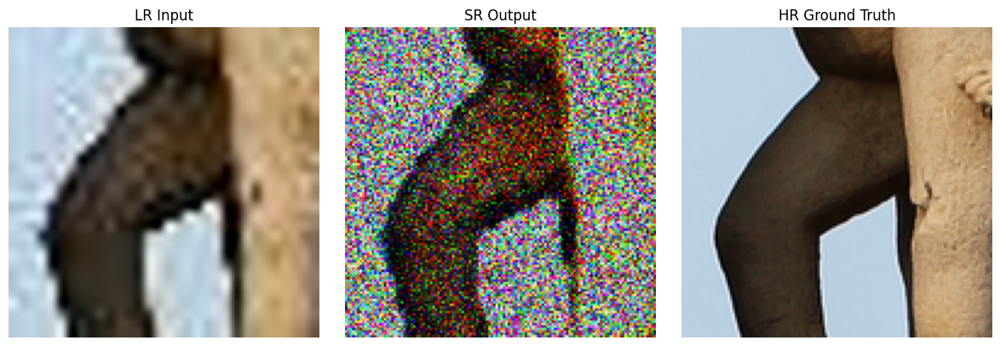

Saved visualization: /content/drive/MyDrive/Rezultati/epoch_20_sample_2.png


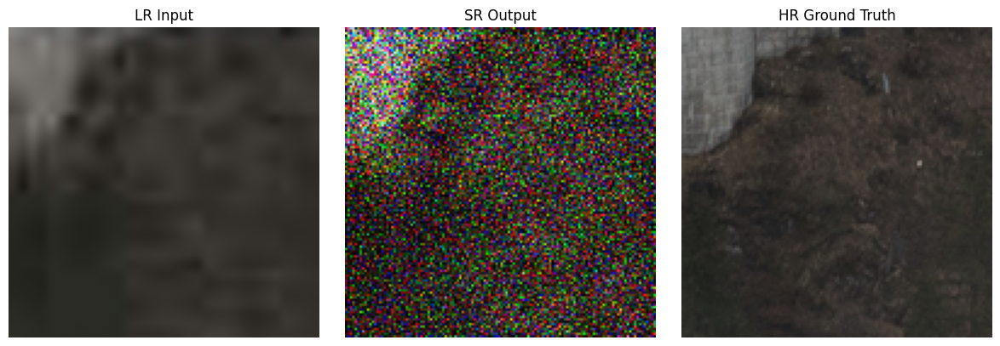

Saved visualization: /content/drive/MyDrive/Rezultati/epoch_20_sample_3.png


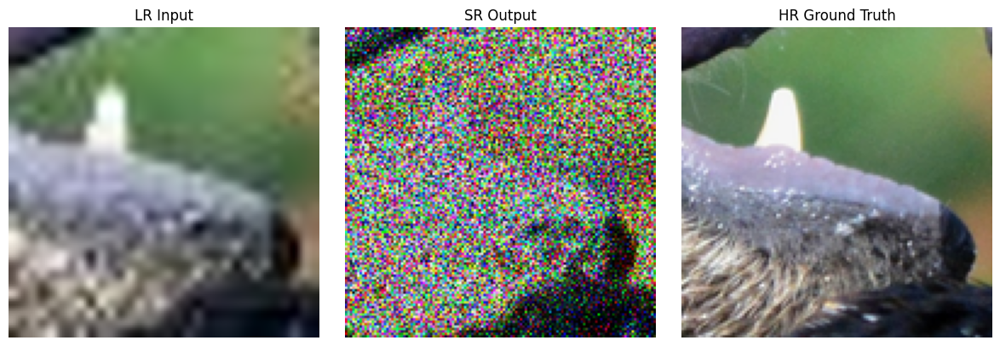

Metrics for epoch: 20 Mean PSNR: 11.230692863464355, Mean SSIM: 0.042336802929639816
Saved model weights at epoch 20


Epoch 21/30 | Train Loss: 0.0112 | MAE: 0.0100 | Perc: 0.1231 || Val Loss: 0.0145 | MAE: 0.0119 | Perc: 0.2569 || PSNR: 9.27 | SSIM: 0.0191


Epoch 22/30 | Train Loss: 0.0110 | MAE: 0.0098 | Perc: 0.1193 || Val Loss: 0.0138 | MAE: 0.0113 | Perc: 0.2497 || PSNR: 9.42 | SSIM: 0.0194


Epoch 23/30 | Train Loss: 0.0109 | MAE: 0.0098 | Perc: 0.1183 || Val Loss: 0.0138 | MAE: 0.0116 | Perc: 0.2237 || PSNR: 9.01 | SSIM: 0.0188


Epoch 24/30 | Train Loss: 0.0108 | MAE: 0.0096 | Perc: 0.1184 || Val Loss: 0.0120 | MAE: 0.0099 | Perc: 0.2032 || PSNR: 9.44 | SSIM: 0.0190


Epoch 25/30 | Train Loss: 0.0111 | MAE: 0.0099 | Perc: 0.1219 || Val Loss: 0.0134 | MAE: 0.0111 | Perc: 0.2314 || PSNR: 9.27 | SSIM: 0.0215


Epoch 26/30 | Train Loss: 0.0108 | MAE: 0.0097 | Perc: 0.1161 || Val Loss: 0.0136 | MAE: 0.0114 | Perc: 0.2197 || PSNR: 9.27 | SSIM: 0.0194


Epoch 27/30 | Train Loss: 0.0105 | MAE: 0.0093 | Perc: 0.1165 || Val Loss: 0.0136 | MAE: 0.0113 | Perc: 0.2253 || PSNR: 9.34 | SSIM: 0.0194


Epoch 28/30 | Train Loss: 0.0107 | MAE: 0.0096 | Perc: 0.1157 || Val Loss: 0.0127 | MAE: 0.0107 | Perc: 0.2020 || PSNR: 9.29 | SSIM: 0.0203


Epoch 29/30 | Train Loss: 0.0107 | MAE: 0.0096 | Perc: 0.1134 || Val Loss: 0.0135 | MAE: 0.0113 | Perc: 0.2128 || PSNR: 9.16 | SSIM: 0.0195


Epoch 30/30 | Train Loss: 0.0108 | MAE: 0.0097 | Perc: 0.1152 || Val Loss: 0.0127 | MAE: 0.0106 | Perc: 0.2056 || PSNR: 9.24 | SSIM: 0.0201
Saved visualization: /content/drive/MyDrive/Rezultati/epoch_30_sample_1.png


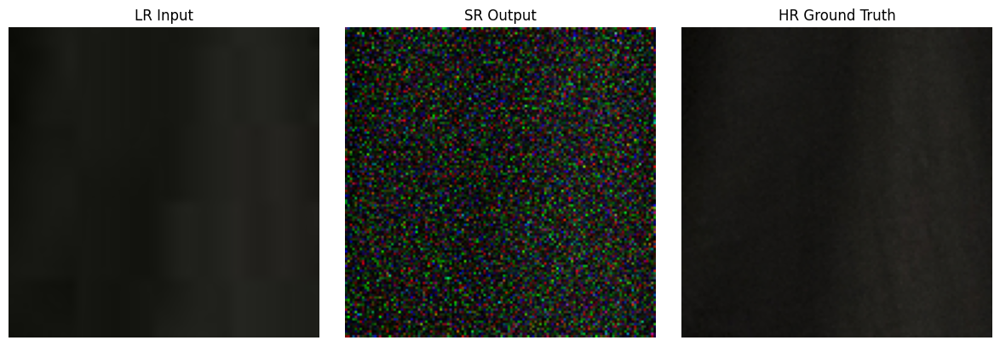

Saved visualization: /content/drive/MyDrive/Rezultati/epoch_30_sample_2.png


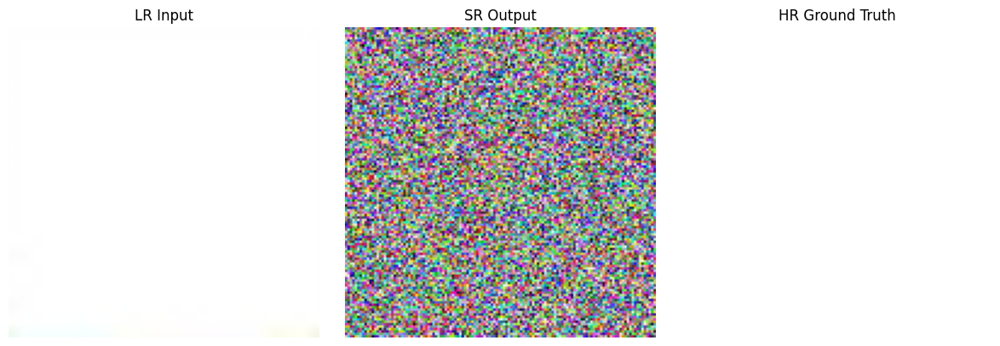

Saved visualization: /content/drive/MyDrive/Rezultati/epoch_30_sample_3.png


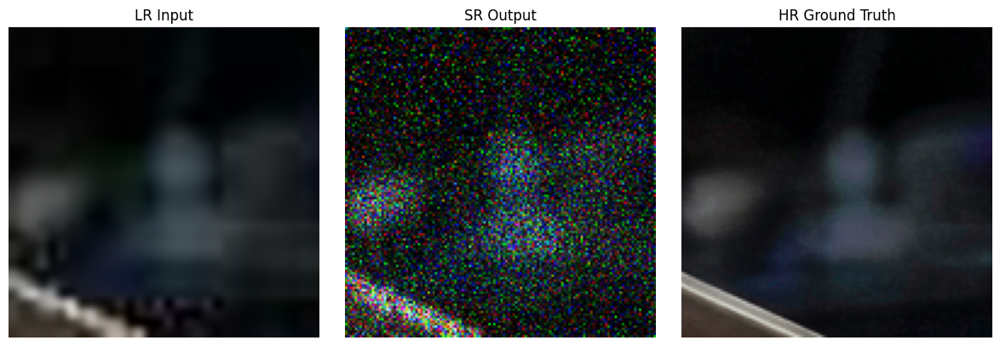

Metrics for epoch: 30 Mean PSNR: 12.644783020019531, Mean SSIM: 0.03979365900158882
Saved model weights at epoch 30


In [18]:
print("Starting training...")

for epoch in range(epochs):

    train_bar = tqdm(train_dataset.take(steps_per_epoch), total=steps_per_epoch, desc=f"Training Epoch {epoch+1}", leave=False)
    total_train_loss = 0.0
    total_train_mae = 0.0
    total_train_perc = 0.0

    for i, (lr_batch, hr_batch) in enumerate(train_bar):
        loss, mae_loss, perc_loss = train_step(
            hr_batch, lr_batch, model,
            timesteps,
            sqrt_alphas_cumprod,
            sqrt_one_minus_alphas_cumprod,
            epoch,
            perceptual_model
        )

        total_train_loss += loss
        total_train_mae += mae_loss
        total_train_perc += perc_loss

        train_bar.set_postfix(loss=float(loss), mae=float(mae_loss), perc=float(perc_loss))

    avg_train_loss = total_train_loss / steps_per_epoch
    avg_train_mae = total_train_mae / steps_per_epoch
    avg_train_perc = total_train_perc / steps_per_epoch

    # --- Validation ---
    total_val_loss = 0.0
    total_mae_loss = 0.0
    total_perc_loss = 0.0
    val_steps = 100

    val_bar = tqdm(valid_dataset.take(val_steps), total=val_steps, desc="Validation", leave=False)

    all_psnr, all_ssim = [], []

    for lr_batch, hr_batch in val_bar:
        val_loss, mae_loss, perc_loss = validation_step(
            hr_batch, lr_batch, model,
            timesteps,
            sqrt_alphas_cumprod,
            sqrt_one_minus_alphas_cumprod,
            epoch,
            perceptual_model
        )

        total_val_loss += val_loss
        total_mae_loss += mae_loss
        total_perc_loss += perc_loss

        sr_batch = sample(lr_batch, model, timesteps, sampling_steps=50)
        psnr_batch = tf.image.psnr(sr_batch, hr_batch, max_val=1.0)
        ssim_batch = tf.image.ssim(sr_batch, hr_batch, max_val=1.0)

        all_psnr.extend(psnr_batch.numpy())
        all_ssim.extend(ssim_batch.numpy())

        val_bar.set_postfix(val_loss=float(val_loss))

    avg_val_loss = total_val_loss / val_steps
    avg_val_mae = total_mae_loss / val_steps
    avg_val_perc = total_perc_loss / val_steps
    mean_psnr = np.mean(all_psnr)
    mean_ssim = np.mean(all_ssim)

    print(f"Epoch {epoch+1}/{epochs} | "
          f"Train Loss: {avg_train_loss:.4f} | MAE: {avg_train_mae:.4f} | Perc: {avg_train_perc:.4f} || "
          f"Val Loss: {avg_val_loss:.4f} | MAE: {avg_val_mae:.4f} | Perc: {avg_val_perc:.4f} || "
          f"PSNR: {mean_psnr:.2f} | SSIM: {mean_ssim:.4f}")

    # Save model and visualization every 10 epochs
    if (epoch + 1) % 10 == 0:
        visualize_sample(model, train_dataset, timesteps, epoch=epoch, save_dir="/content/drive/MyDrive/Rezultati/")
        model.save_weights(f"/content/drive/MyDrive/Weights/model_weights_epoch_{epoch+1}.weights.h5")
        print(f"Saved model weights at epoch {epoch+1}")

In [ ]:
def evaluate_model(model, test_dataset, timesteps=2000, sampling_steps=2000, display_every_n=10):
    psnr_values = []
    ssim_values = []

    for i, (lr_img, hr_img) in enumerate(test_dataset):
        sr_img = sample(lr_img, model, timesteps=timesteps, sampling_steps=sampling_steps)

        for j in range(lr_img.shape[0]):  # loop over batch
            psnr = tf.image.psnr(sr_img[j], hr_img[j], max_val=1.0)
            ssim = tf.image.ssim(sr_img[j], hr_img[j], max_val=1.0)

            psnr_values.append(psnr.numpy())
            ssim_values.append(ssim.numpy())

            if (i * lr_img.shape[0] + j) % display_every_n == 0:
                plt.figure(figsize=(12, 4))
                plt.suptitle(f"Sample {i*lr_img.shape[0]+j} — PSNR: {psnr:.2f}, SSIM: {ssim:.4f}", fontsize=14)

                plt.subplot(1, 3, 1)
                plt.imshow(np.clip(lr_img[j].numpy(), 0, 1))
                plt.title("Low Resolution")
                plt.axis("off")

                plt.subplot(1, 3, 2)
                plt.imshow(np.clip(sr_img[j].numpy(), 0, 1))
                plt.title("Super Resolved")
                plt.axis("off")

                plt.subplot(1, 3, 3)
                plt.imshow(np.clip(hr_img[j].numpy(), 0, 1))
                plt.title("Ground Truth")
                plt.axis("off")

                plt.show()

    print(f"\n Test PSNR: {np.mean(psnr_values):.2f}, SSIM: {np.mean(ssim_values):.4f}")

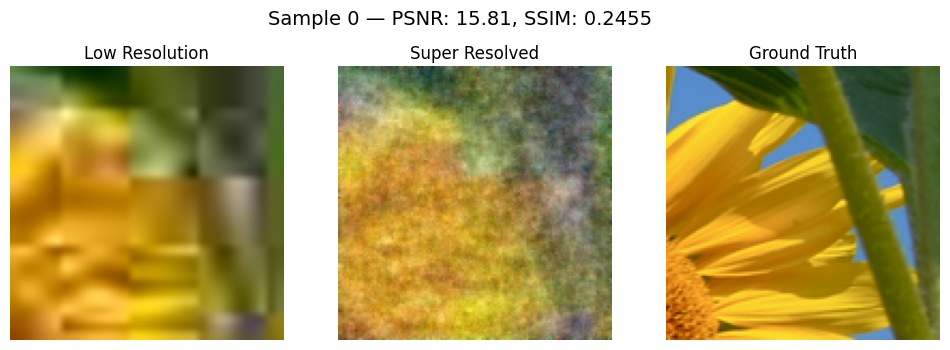

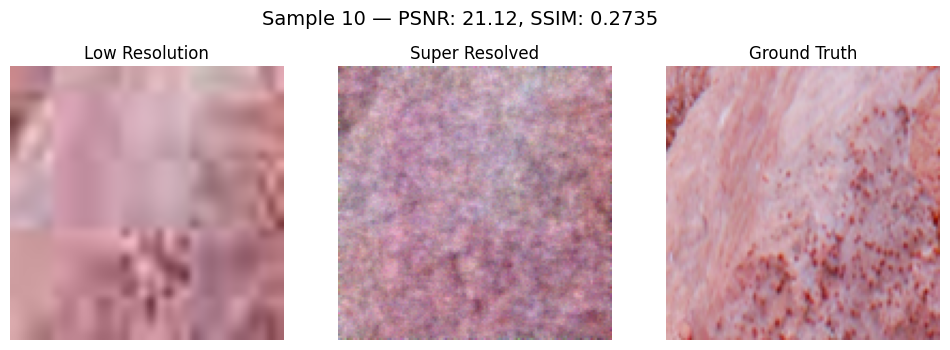

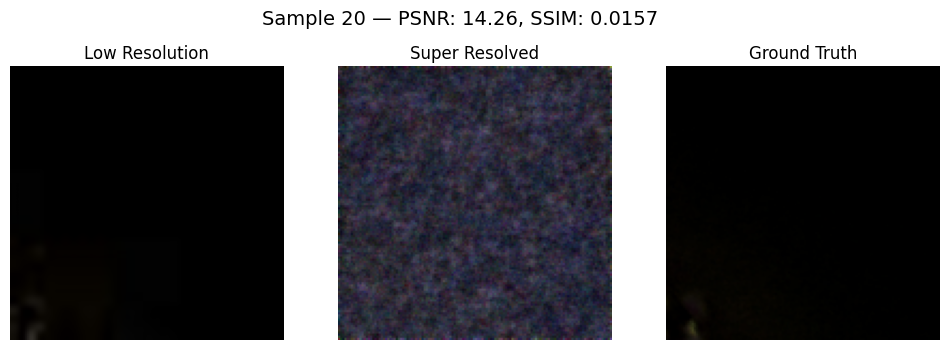

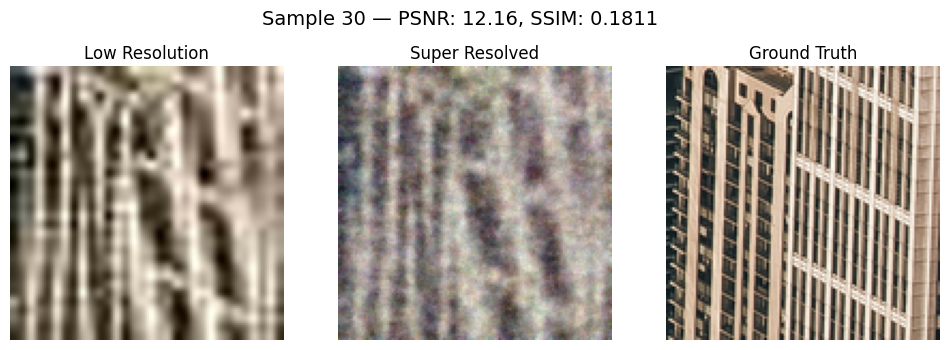

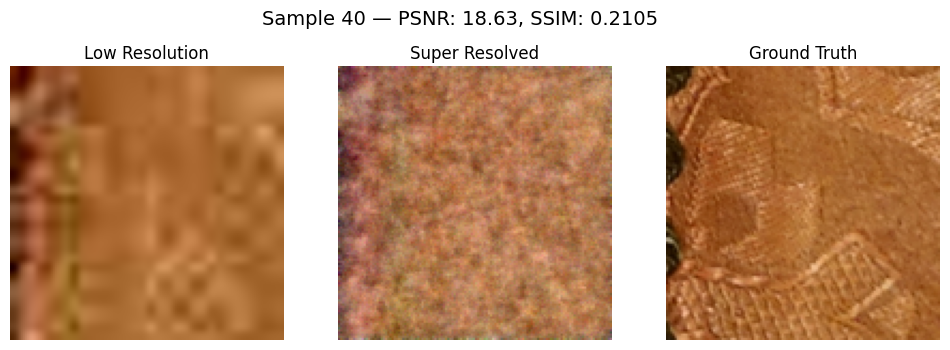

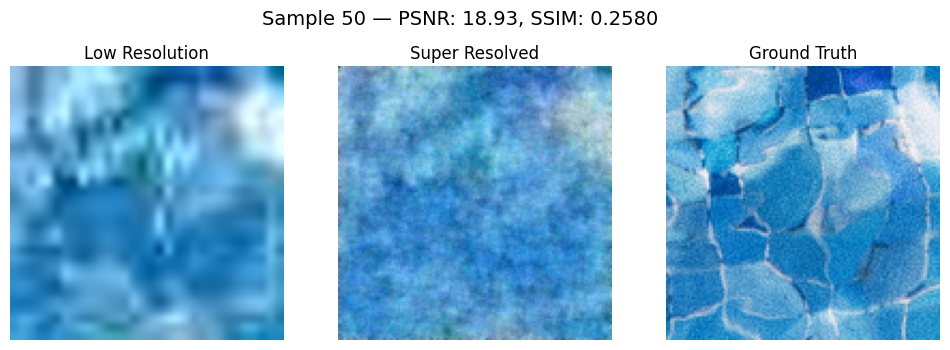

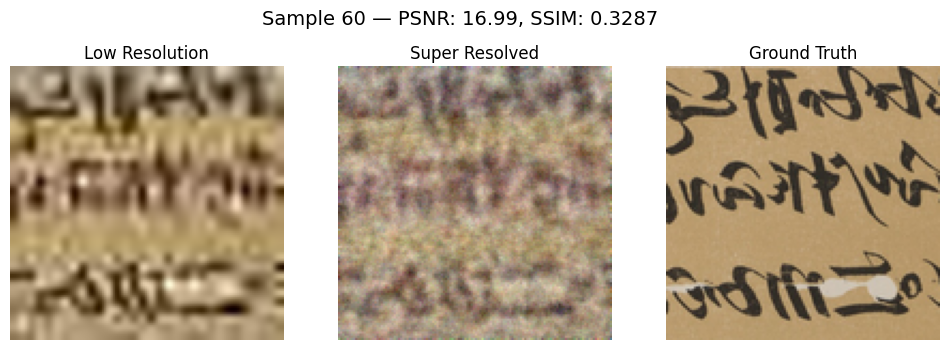

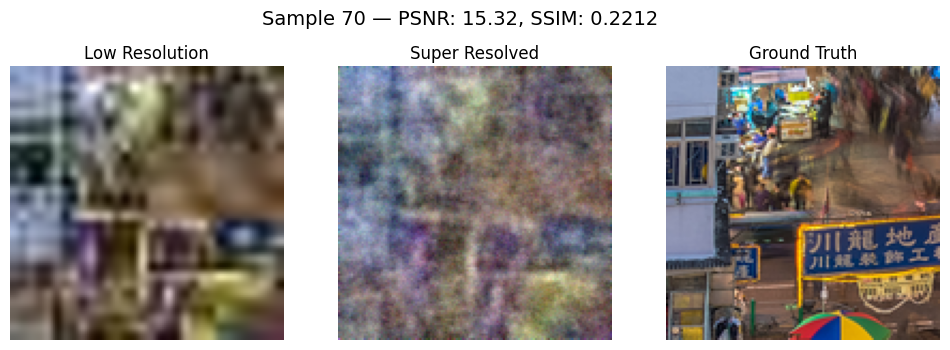

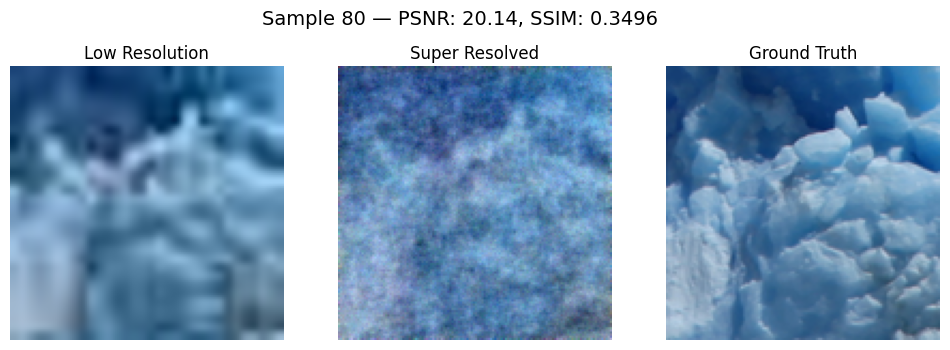

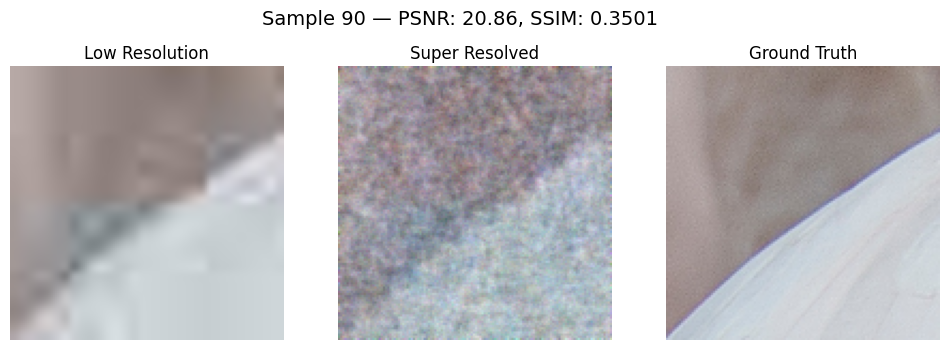


 Test PSNR: 17.81, SSIM: 0.2902


In [ ]:
evaluate_model(model, test_dataset)